In [ ]:
# imports
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# import basic libraries
import os
from glob import glob

# import plotting
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import matplotlib
import seaborn as sns

# import image manipulation
from PIL import Image
import imageio

In [ ]:
! pip install --upgrade imgaug

In [ ]:
# import data augmentation
import imgaug as ia
from imgaug import augmenters as iaa
# import segmentation maps from imgaug
from imgaug.augmentables.segmaps import SegmentationMapOnImage
import imgaug.imgaug

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# set paths to train and test image datasets
TRAIN_PATH = '/content/drive/MyDrive/train_images/'
TEST_PATH = '/content/drive/MyDrive/Test data/'

# load dataframe with train labels
train_df = pd.read_csv("/content/drive/MyDrive/train.csv")
train_fns = sorted(glob(TRAIN_PATH + '*.jpg'))

print('There are {} images in the train set.'.format(len(train_df)))

There are 22184 images in the train set.


In [ ]:
# load the filenames for test images
test_fns = sorted(glob(TEST_PATH + '*.jpg'))

print('There are {} images in the test set.'.format(len(test_fns)))

There are 3705 images in the test set.


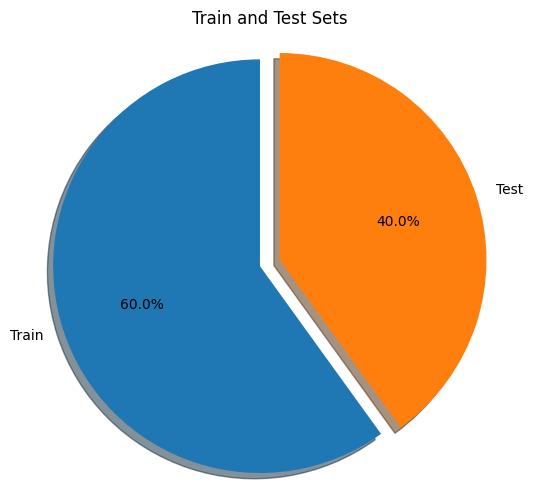

In [ ]:
# plotting a pie chart which demonstrates train and test sets
labels = 'Train', 'Test'
sizes = [len(train_fns), len(test_fns)]
explode = (0, 0.1)

fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90)
ax.axis('equal')
ax.set_title('Train and Test Sets')

plt.show()

In [ ]:
train_df.head()

,Image_Label,EncodedPixels
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...
2,0011165.jpg_Gravel,NaN
3,0011165.jpg_Sugar,NaN
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...


In [ ]:
print('There are {} rows with empty segmentation maps.'.format(len(train_df) - train_df.EncodedPixels.count()))

There are 10348 rows with empty segmentation maps.


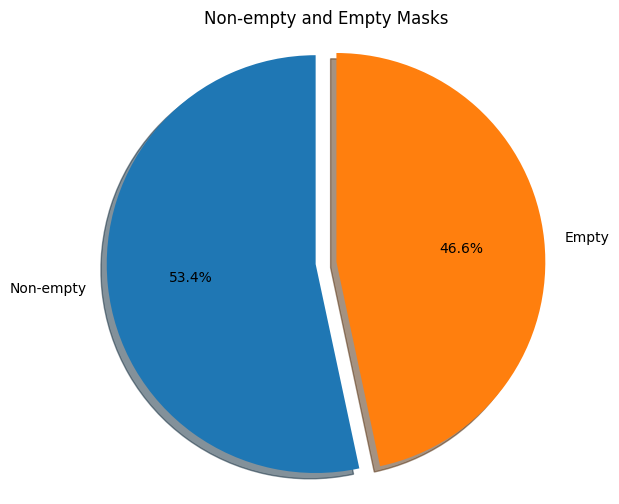

In [ ]:
# plotting a pie chart
labels = 'Non-empty', 'Empty'
sizes = [train_df.EncodedPixels.count(), len(train_df) - train_df.EncodedPixels.count()]
explode = (0, 0.1)

fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90)
ax.axis('equal')
ax.set_title('Non-empty and Empty Masks')

plt.show()

In [ ]:
# split column
split_df = train_df["Image_Label"].str.split("_", n = 1, expand = True)
# add new columns to train_df
train_df['Image'] = split_df[0]
train_df['Label'] = split_df[1]

# check the result
train_df.head()

,Image_Label,EncodedPixels,Image,Label
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...,0011165.jpg,Fish
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0011165.jpg,Flower
2,0011165.jpg_Gravel,NaN,0011165.jpg,Gravel
3,0011165.jpg_Sugar,NaN,0011165.jpg,Sugar
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...,002be4f.jpg,Fish


In [ ]:
fish = train_df[train_df['Label'] == 'Fish'].EncodedPixels.count()
flower = train_df[train_df['Label'] == 'Flower'].EncodedPixels.count()
gravel = train_df[train_df['Label'] == 'Gravel'].EncodedPixels.count()
sugar = train_df[train_df['Label'] == 'Sugar'].EncodedPixels.count()

print('There are {} fish clouds'.format(fish))
print('There are {} flower clouds'.format(flower))
print('There are {} gravel clouds'.format(gravel))
print('There are {} sugar clouds'.format(sugar))

There are 2781 fish clouds
There are 2365 flower clouds
There are 2939 gravel clouds
There are 3751 sugar clouds


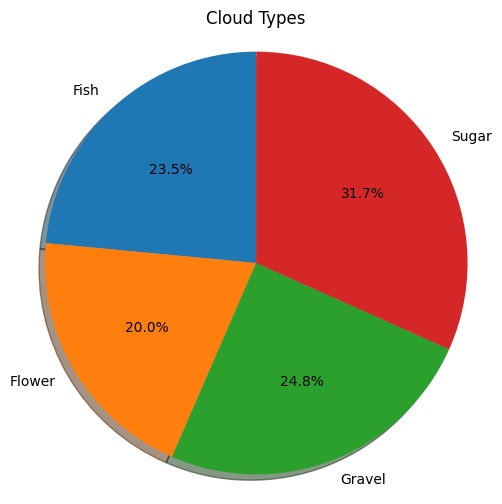

In [ ]:
# plotting a pie chart
labels = 'Fish', 'Flower', 'Gravel', 'Sugar'
sizes = [fish, flower, gravel, sugar]

fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90)
ax.axis('equal')
ax.set_title('Cloud Types')

plt.show()

In [ ]:
labels_per_image = train_df.groupby('Image')['EncodedPixels'].count()

In [ ]:
print('The mean number of labels per image is {}'.format(labels_per_image.mean()))

The mean number of labels per image is 2.134150739271547


Text(0.5, 1.0, 'Number of Labels per Image')

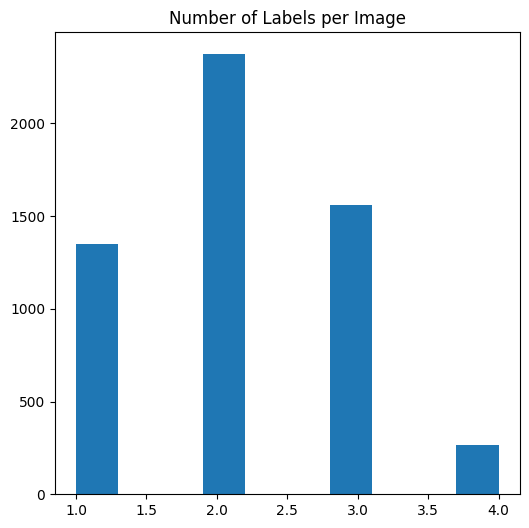

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.hist(labels_per_image)
ax.set_title('Number of Labels per Image')

In [ ]:
# create dummy columns for each cloud type
corr_df = pd.get_dummies(train_df, columns = ['Label'])
# fill null values with '-1'
corr_df = corr_df.fillna('-1')

# define a helper function to fill dummy columns
def get_dummy_value(row, cloud_type):
    ''' Get value for dummy column '''
    if cloud_type == 'fish':
        return row['Label_Fish'] * (row['EncodedPixels'] != '-1')
    if cloud_type == 'flower':
        return row['Label_Flower'] * (row['EncodedPixels'] != '-1')
    if cloud_type == 'gravel':
        return row['Label_Gravel'] * (row['EncodedPixels'] != '-1')
    if cloud_type == 'sugar':
        return row['Label_Sugar'] * (row['EncodedPixels'] != '-1')

# fill dummy columns
corr_df['Label_Fish'] = corr_df.apply(lambda row: get_dummy_value(row, 'fish'), axis=1)
corr_df['Label_Flower'] = corr_df.apply(lambda row: get_dummy_value(row, 'flower'), axis=1)
corr_df['Label_Gravel'] = corr_df.apply(lambda row: get_dummy_value(row, 'gravel'), axis=1)
corr_df['Label_Sugar'] = corr_df.apply(lambda row: get_dummy_value(row, 'sugar'), axis=1)

# check the result
corr_df.head()

,Image_Label,EncodedPixels,Image,Label_Fish,Label_Flower,Label_Gravel,Label_Sugar
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...,0011165.jpg,1,0,0,0
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0011165.jpg,0,1,0,0
2,0011165.jpg_Gravel,-1,0011165.jpg,0,0,0,0
3,0011165.jpg_Sugar,-1,0011165.jpg,0,0,0,0
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...,002be4f.jpg,1,0,0,0


In [ ]:
# group by the image
corr_df = corr_df.groupby('Image')['Label_Fish', 'Label_Flower', 'Label_Gravel', 'Label_Sugar'].max()
corr_df.head()

<ipython-input-23-b49145703631>:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  corr_df = corr_df.groupby('Image')['Label_Fish', 'Label_Flower', 'Label_Gravel', 'Label_Sugar'].max()


,Label_Fish,Label_Flower,Label_Gravel,Label_Sugar
Image,,,,
0011165.jpg,1,1,0,0
002be4f.jpg,1,1,0,1
0031ae9.jpg,1,1,0,1
0035239.jpg,0,1,1,0
003994e.jpg,1,0,1,1


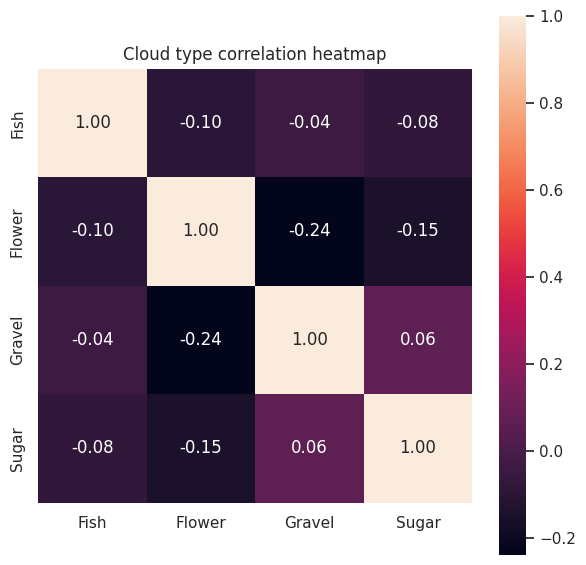

In [ ]:
#Find out correlation between columns and plot
corrs = np.corrcoef(corr_df.values.T)
sns.set(font_scale=1)
sns.set(rc={'figure.figsize':(7,7)})
hm=sns.heatmap(corrs, cbar = True, annot=True, square = True, fmt = '.2f',
              yticklabels = ['Fish', 'Flower', 'Gravel', 'Sugar'],
               xticklabels = ['Fish', 'Flower', 'Gravel', 'Sugar']).set_title('Cloud type correlation heatmap')

fig = hm.get_figure()

In [ ]:
def get_image_sizes(train = True):
    '''
    Function to get sizes of images from test and train sets.
    INPUT:
        train - indicates whether we are getting sizes of images from train or test set
    '''
    if train:
        path = TRAIN_PATH
    else:
        path = TEST_PATH

    widths = []
    heights = []

    images = sorted(glob(path + '*.jpg'))

    max_im = Image.open(images[0])
    min_im = Image.open(images[0])

    for im in range(0, len(images)):
        image = Image.open(images[im])
        width, height = image.size

        if len(widths) > 0:
            if width > max(widths):
                max_im = image

            if width < min(widths):
                min_im = image

        widths.append(width)
        heights.append(height)

    return widths, heights, max_im, min_im

In [ ]:
# get sizes of images from test and train sets
train_widths, train_heights, max_train, min_train = get_image_sizes(train = True)
test_widths, test_heights, max_test, min_test = get_image_sizes(train = False)

print('Maximum width for training set is {}'.format(max(train_widths)))
print('Minimum width for training set is {}'.format(min(train_widths)))
print('Maximum height for training set is {}'.format(max(train_heights)))
print('Minimum height for training set is {}'.format(min(train_heights)))

Maximum width for training set is 2100
Minimum width for training set is 2100
Maximum height for training set is 1400
Minimum height for training set is 1400


In [ ]:
print('Maximum width for test set is {}'.format(max(test_widths)))
print('Minimum width for test set is {}'.format(min(test_widths)))
print('Maximum height for test set is {}'.format(max(test_heights)))
print('Minimum height for test set is {}'.format(min(test_heights)))

Maximum width for test set is 2100
Minimum width for test set is 2100
Maximum height for test set is 1400
Minimum height for test set is 1400


In [ ]:
# helper function to get a string of labels for the picture
def get_labels(image_id):
    ''' Function to get the labels for the image by name'''
    im_df = train_df[train_df['Image'] == image_id].fillna('-1')
    im_df = im_df[im_df['EncodedPixels'] != '-1'].groupby('Label').count()

    index = im_df.index
    all_labels = ['Fish', 'Flower', 'Gravel', 'Sugar']

    labels = ''

    for label in all_labels:
        if label in index:
            labels = labels + ' ' + label

    return labels

# function to plot a grid of images and their labels
def plot_training_images(width = 5, height = 2):
    """
    Function to plot grid with several examples of cloud images from train set.
    INPUT:
        width - number of images per row
        height - number of rows

    OUTPUT: None
    """

    # get a list of images from training set
    images = sorted(glob(TRAIN_PATH + '*.jpg'))

    fig, axs = plt.subplots(height, width, figsize=(width * 3, height * 3))

    # create a list of random indices
    rnd_indices = rnd_indices = [np.random.choice(range(0, len(images))) for i in range(height * width)]

    for im in range(0, height * width):
        # open image with a random index
        image = Image.open(images[rnd_indices[im]])

        i = im // width
        j = im % width

        # plot the image
        axs[i,j].imshow(image) #plot the data
        axs[i,j].axis('off')
        axs[i,j].set_title(get_labels(images[rnd_indices[im]].split('/')[-1]))

    # set suptitle
    plt.suptitle('Sample images from the train set')
    plt.show()

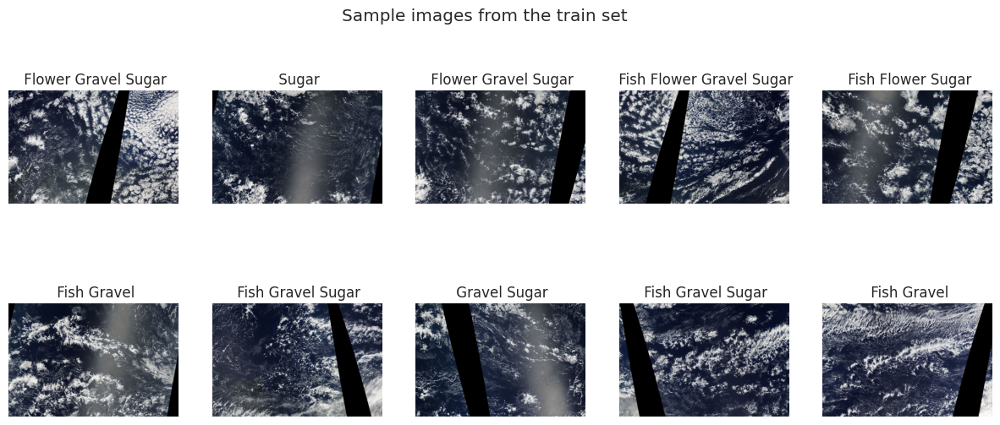

In [ ]:
plot_training_images()

In [ ]:
def rle_to_mask(rle_string, width, height):
    '''
    convert RLE(run length encoding) string to numpy array

    Parameters:
    rle_string (str): string of rle encoded mask
    height (int): height of the mask
    width (int): width of the mask

    Returns:
    numpy.array: numpy array of the mask
    '''

    rows, cols = height, width

    if rle_string == -1:
        return np.zeros((height, width))
    else:
        rle_numbers = [int(num_string) for num_string in rle_string.split(' ')]
        rle_pairs = np.array(rle_numbers).reshape(-1,2)
        img = np.zeros(rows*cols, dtype=np.uint8)
        for index, length in rle_pairs:
            index -= 1
            img[index:index+length] = 255
        img = img.reshape(cols,rows)
        img = img.T
        return img

In [ ]:
from __future__ import print_function
import numpy as np

def valid_imshow_data(data):
    data = np.asarray(data)
    if data.ndim == 2:
        return True
    elif data.ndim == 3:
        if 3 <= data.shape[2] <= 4:
            return True
        else:
            print('The "data" has 3 dimensions but the last dimension '
                  'must have a length of 3 (RGB) or 4 (RGBA), not "{}".'
                  ''.format(data.shape[2]))
            return False
    else:
        print('To visualize an image the data must be 2 dimensional or '
              '3 dimensional, not "{}".'
              ''.format(data.ndim))
        return False

In [ ]:
def get_mask(line_id, shape = (2100, 1400)):
    '''
    Function to visualize the image and the mask.
    INPUT:
        line_id - id of the line to visualize the masks
        shape - image shape
    RETURNS:
        np_mask - numpy segmentation map
    '''
    # replace null values with '-1'
    im_df = train_df.fillna('-1')

    # convert rle to mask
    rle = im_df.loc[line_id]['EncodedPixels']
    if rle != '-1':
        np_mask = rle_to_mask(rle, shape[0], shape[1])
        np_mask = np.clip(np_mask, 0, 1)
    else:
        # empty mask
        np_mask = np.zeros((shape[0],shape[1]), dtype=np.uint8)

    return np_mask

# helper function to get segmentation mask for an image by filename
def get_mask_by_image_id(image_id, label):
    '''
    Function to visualize several segmentation maps.
    INPUT:
        image_id - filename of the image
    RETURNS:
        np_mask - numpy segmentation map
    '''
    im_df = train_df[train_df['Image'] == image_id.split('/')[-1]].fillna('-1')

    image = np.asarray(Image.open(image_id))

    rle = im_df[im_df['Label'] == label]['EncodedPixels'].values[0]
    if rle != '-1':
        np_mask = rle_to_mask(rle, np.asarray(image).shape[1], np.asarray(image).shape[0])
        np_mask = np.clip(np_mask, 0, 1)
    else:
        # empty mask
        np_mask = np.zeros((np.asarray(image).shape[0], np.asarray(image).shape[1]), dtype=np.uint8)

    return np_mask

def visualize_image_with_mask(line_id):
    '''
    Function to visualize the image and the mask.
    INPUT:
        line_id - id of the line to visualize the masks
    '''
    # replace null values with '-1'
    im_df = train_df.fillna('-1')

    # get segmentation mask
    np_mask = get_mask(line_id)

    # open the image
    image = Image.open(TRAIN_PATH + im_df.loc[line_id]['Image'])

    # create segmentation map
    segmap = SegmentationMapOnImage(np_mask, np_mask.shape, nb_classes=2)

    # visualize the image and map
    side_by_side = np.hstack([
        segmap.draw_on_image(np.asarray(image))
    ]).reshape(np.asarray(image).shape)

    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis('off')
    plt.title(im_df.loc[line_id]['Label'])

    ax.imshow(side_by_side)

/usr/local/lib/python3.10/dist-packages/imgaug/imgaug.py:184: DeprecationWarning: Function `SegmentationMapOnImage()` is deprecated. Use `SegmentationMapsOnImage` instead. (Note the plural 'Maps' instead of old 'Map'.).
  warn_deprecated(msg, stacklevel=3)
/usr/local/lib/python3.10/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Providing nb_classes to SegmentationMapsOnImage is no longer necessary and hence deprecated. The argument is ignored and can be safely removed.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)


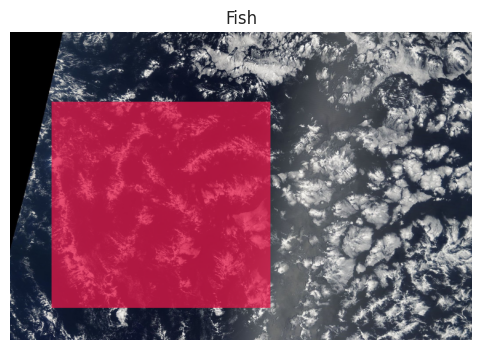

In [ ]:
visualize_image_with_mask(0)

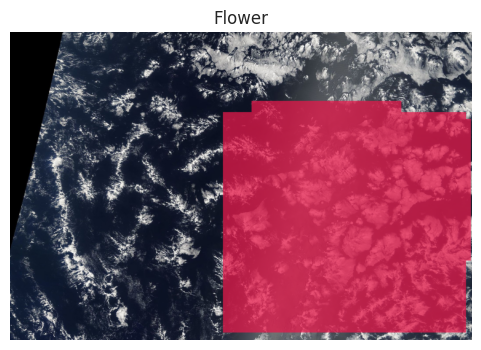

In [ ]:
visualize_image_with_mask(1)

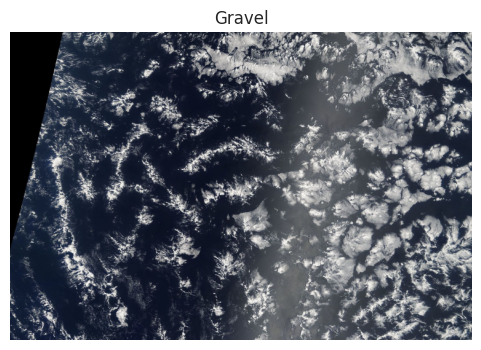

In [ ]:
# empty mask:
visualize_image_with_mask(2)

In [ ]:
def plot_training_images_and_masks(n_images = 3):
    '''
    Function to plot several random images with segmentation masks.
    INPUT:
        n_images - number of images to visualize
    '''

    # get a list of images from training set
    images = sorted(glob(TRAIN_PATH + '*.jpg'))

    fig, ax = plt.subplots(n_images, 4, figsize=(20, 10))

    # create a list of random indices
    rnd_indices = [np.random.choice(range(0, len(images))) for i in range(n_images)]

    for im in range(0, n_images):
        # open image with a random index
        image = Image.open(images[rnd_indices[im]])

        # get segmentation masks
        fish = get_mask_by_image_id(images[rnd_indices[im]], 'Fish')
        flower = get_mask_by_image_id(images[rnd_indices[im]], 'Flower')
        gravel = get_mask_by_image_id(images[rnd_indices[im]], 'Gravel')
        sugar = get_mask_by_image_id(images[rnd_indices[im]], 'Sugar')

        # draw masks on images
        shape = (np.asarray(image).shape[0], np.asarray(image).shape[1])
        if np.sum(fish) > 0:
            segmap_fish = SegmentationMapOnImage(fish, shape=shape, nb_classes=2)
            im_fish = np.array(segmap_fish.draw_on_image(np.asarray(image))).reshape(np.asarray(image).shape)
        else:
            im_fish = np.asarray(image)

        if np.sum(flower) > 0:
            segmap_flower = SegmentationMapOnImage(flower, shape=shape, nb_classes=2)
            im_flower = np.array(segmap_flower.draw_on_image(np.asarray(image))).reshape(np.asarray(image).shape)
        else:
            im_flower = np.asarray(image)

        if np.sum(gravel) > 0:
            segmap_gravel = SegmentationMapOnImage(gravel, shape=shape, nb_classes=2)
            im_gravel = np.array(segmap_gravel.draw_on_image(np.asarray(image))).reshape(np.asarray(image).shape)
        else:
            im_gravel = np.asarray(image)

        if np.sum(sugar) > 0:
            segmap_sugar = SegmentationMapOnImage(sugar, shape=shape, nb_classes=2)
            im_sugar = np.array(segmap_sugar.draw_on_image(np.asarray(image))).reshape(np.asarray(image).shape)
        else:
            im_sugar = np.asarray(image)

        # plot images and masks
        ax[im, 0].imshow(im_fish)
        ax[im, 0].axis('off')
        ax[im, 0].set_title('Fish')

        # plot images and masks
        ax[im, 1].imshow(im_flower)
        ax[im, 1].axis('off')
        ax[im, 1].set_title('Flower')

        # plot images and masks
        ax[im, 2].imshow(im_gravel)
        ax[im, 2].axis('off')
        ax[im, 2].set_title('Gravel')

        # plot images and masks
        ax[im, 3].imshow(im_sugar)
        ax[im, 3].axis('off')
        ax[im, 3].set_title('Sugar')

    plt.suptitle('Sample images from the train set')
    plt.show()

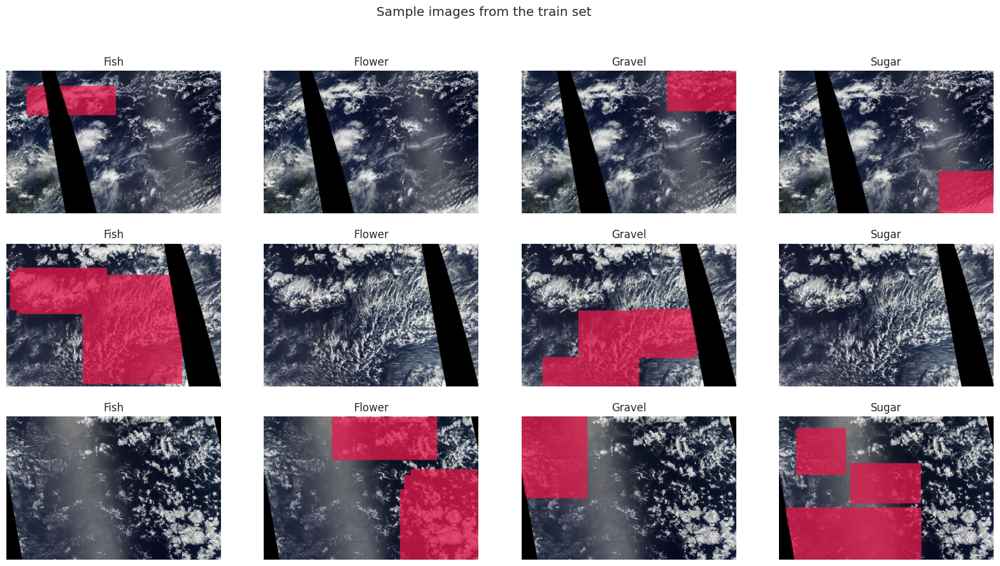

In [ ]:
plot_training_images_and_masks(n_images = 3)

In [ ]:
def create_segmap(image_id):
    '''
    Helper function to create a segmentation map for an image by image filename
    '''
    # open the image
    image = np.asarray(Image.open(image_id))

    # get masks for different classes
    fish_mask = get_mask_by_image_id(image_id, 'Fish')
    flower_mask = get_mask_by_image_id(image_id, 'Flower')
    gravel_mask = get_mask_by_image_id(image_id, 'Gravel')
    sugar_mask = get_mask_by_image_id(image_id, 'Sugar')

    # label numpy map with 4 classes
    segmap = np.zeros((image.shape[0], image.shape[1]), dtype=np.int32)
    segmap = np.where(fish_mask == 1, 1, segmap)
    segmap = np.where(flower_mask == 1, 2, segmap)
    segmap = np.where(gravel_mask == 1, 3, segmap)
    segmap = np.where(sugar_mask == 1, 4, segmap)

    # create a segmantation map
    segmap = SegmentationMapOnImage(segmap, shape=image.shape, nb_classes=5)

    return segmap

def draw_labels(image, np_mask, label):
    '''
    Function to add labels to the image.
    '''
    if np.sum(np_mask) > 0:
        x,y = 0,0
        x,y = np.argwhere(np_mask==1)[0]

        image = imgaug.imgaug.draw_text(image, x, y, label, color=(255, 255, 255), size=50)
    return image

def draw_segmentation_maps(image_id):
    '''
    Helper function to draw segmantation maps and text.
    '''
    # open the image
    image = np.asarray(Image.open(image_id))

    # get masks for different classes
    fish_mask = get_mask_by_image_id(image_id, 'Fish')
    flower_mask = get_mask_by_image_id(image_id, 'Flower')
    gravel_mask = get_mask_by_image_id(image_id, 'Gravel')
    sugar_mask = get_mask_by_image_id(image_id, 'Sugar')

    # label numpy map with 4 classes
    segmap = create_segmap(image_id)

    # draw the map on image
    image = np.asarray(segmap.draw_on_image(np.asarray(image))).reshape(np.asarray(image).shape)

    image = draw_labels(image, fish_mask, 'Fish')
    image = draw_labels(image, flower_mask, 'Flower')
    image = draw_labels(image, gravel_mask, 'Gravel')
    image = draw_labels(image, sugar_mask, 'Sugar')

    return image

# helper function to visualize several segmentation maps on a single image
def visualize_several_maps(image_id):
    '''
    Function to visualize several segmentation maps.
    INPUT:
        image_id - filename of the image
    '''
    # open the image
    image = np.asarray(Image.open(image_id))

    # draw segmentation maps and labels on image
    image = draw_segmentation_maps(image_id)

    # visualize the image and map
    side_by_side = np.hstack([
        image
    ])

    labels = get_labels(image_id.split('/')[-1])

    fig, ax = plt.subplots(figsize=(15, 7))
    ax.axis('off')
    plt.title('Segmentation maps:' + labels)
    plt.legend()

    ax.imshow(side_by_side)

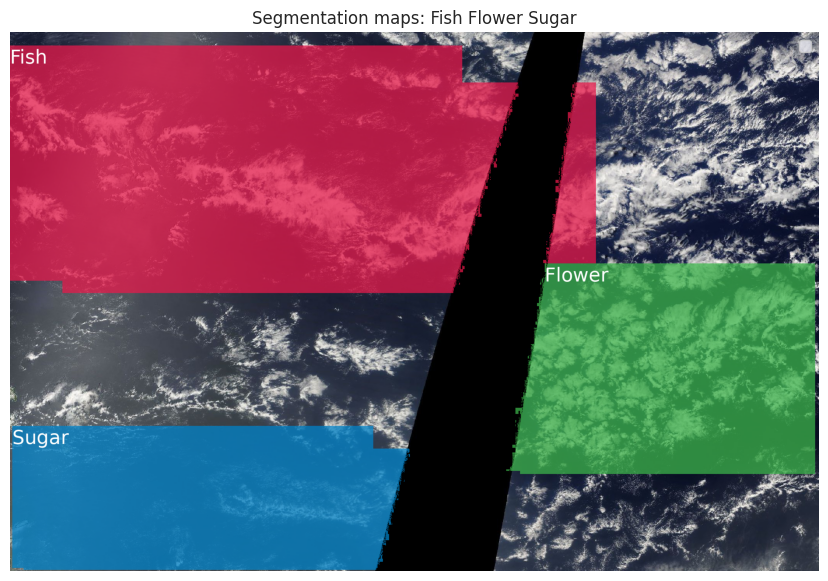

In [ ]:
# create list of all training images filenames
train_fns = sorted(glob(TRAIN_PATH + '*.jpg'))

# generate random index for an image
np.random.seed(41)
rnd_index = np.random.choice(range(len(train_fns)))

# call helper function to visualize the image
visualize_several_maps(train_fns[rnd_index])

In [ ]:
# function to plot a grid of images and their labels and segmantation maps
def plot_training_images_and_masks(width = 2, height = 3):
    """
    Function to plot grid with several examples of cloud images from train set.
    INPUT:
        width - number of images per row
        height - number of rows

    OUTPUT: None
    """

    # get a list of images from training set
    images = sorted(glob(TRAIN_PATH + '*.jpg'))

    fig, axs = plt.subplots(height, width, figsize=(20, 20))

    # create a list of random indices
    rnd_indices = rnd_indices = [np.random.choice(range(0, len(images))) for i in range(height * width)]

    for im in range(0, height * width):
        # open image with a random index
        image = Image.open(images[rnd_indices[im]])
        # draw segmentation maps and labels on image
        image = draw_segmentation_maps(images[rnd_indices[im]])

        i = im // width
        j = im % width

        # plot the image
        axs[i,j].imshow(image) #plot the data
        axs[i,j].axis('off')
        axs[i,j].set_title(get_labels(images[rnd_indices[im]].split('/')[-1]))

    # set suptitle
    plt.suptitle('Sample images from the train set')
    plt.show()

/usr/local/lib/python3.10/dist-packages/imgaug/imgaug.py:184: DeprecationWarning: Function `SegmentationMapOnImage()` is deprecated. Use `SegmentationMapsOnImage` instead. (Note the plural 'Maps' instead of old 'Map'.).
  warn_deprecated(msg, stacklevel=3)
/usr/local/lib/python3.10/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Providing nb_classes to SegmentationMapsOnImage is no longer necessary and hence deprecated. The argument is ignored and can be safely removed.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.10/dist-packages/imgaug/imgaug.py:184: DeprecationWarning: Function `SegmentationMapOnImage()` is deprecated. Use `SegmentationMapsOnImage` instead. (Note the plural 'Maps' instead of old 'Map'.).
  warn_deprecated(msg, stacklevel=3)
/usr/local/lib/python3.10/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Providing nb_classes to SegmentationMapsOnImage is no longer necessary and hence deprecated. The argument is ignor

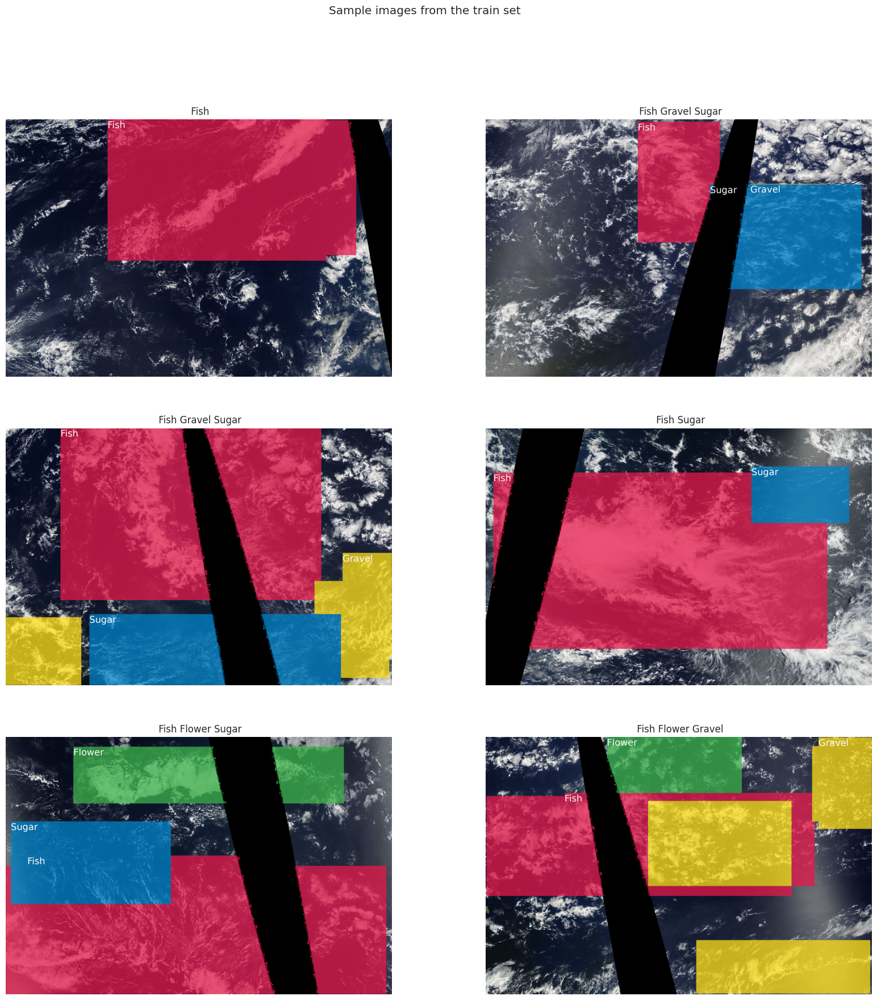

In [ ]:
np.random.seed(42)
plot_training_images_and_masks()

/usr/local/lib/python3.10/dist-packages/imgaug/imgaug.py:184: DeprecationWarning: Function `SegmentationMapOnImage()` is deprecated. Use `SegmentationMapsOnImage` instead. (Note the plural 'Maps' instead of old 'Map'.).
  warn_deprecated(msg, stacklevel=3)
/usr/local/lib/python3.10/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Providing nb_classes to SegmentationMapsOnImage is no longer necessary and hence deprecated. The argument is ignored and can be safely removed.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)


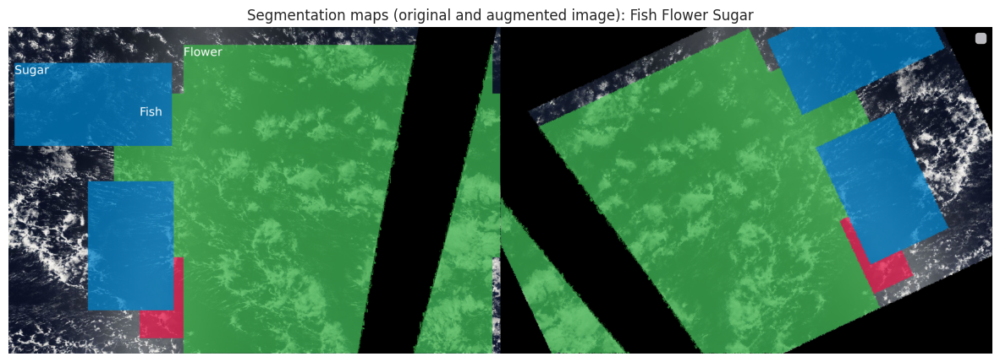

In [ ]:
# initialize augmentations
seq = iaa.Sequential([
    iaa.Affine(rotate=(-30, 30)),
    iaa.Fliplr(0.5),
    iaa.ElasticTransformation(alpha=10, sigma=1)
])

# generate random index for an image
rnd_index = np.random.choice(range(len(train_fns)))
img_id = train_fns[rnd_index]

image = Image.open(img_id)
segmap = create_segmap(img_id)

# apply augmentation for image and mask
image_aug, segmap_aug = seq(image=np.asarray(image), segmentation_maps=segmap)

# visualize the image and map
side_by_side = np.hstack([
    draw_segmentation_maps(img_id),
    np.asarray(segmap_aug.draw_on_image(image_aug)).reshape(np.asarray(image).shape)
])

labels = get_labels(img_id.split('/')[-1])

fig, ax = plt.subplots(figsize=(15, 7))
ax.axis('off')
plt.title('Segmentation maps (original and augmented image):' + labels)
plt.legend()

ax.imshow(side_by_side)

In [ ]:
def add_mask_areas(train_df):
    '''
    Helper function to add mask area as a new column to the dataframe
    INPUT:
        train_df - dataset with training labels
    '''
    masks_df = train_df.copy()
    masks_df['Area'] = 0

    for i, row in masks_df.iterrows():
        masks_df['Area'].loc[i] = np.sum(get_mask(i))

    return masks_df

In [ ]:
masks_df = add_mask_areas(train_df)

<ipython-input-43-7995bcefae6b>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  masks_df['Area'].loc[i] = np.sum(get_mask(i))


<ipython-input-45-0a12f35ee3e4>:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(masks_df[masks_df['Label'] == 'Fish']['Area'].values, kde=False, label='Fish')
<ipython-input-45-0a12f35ee3e4>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(masks_df[masks_df['Label'] == 'Gravel']['Area'].values

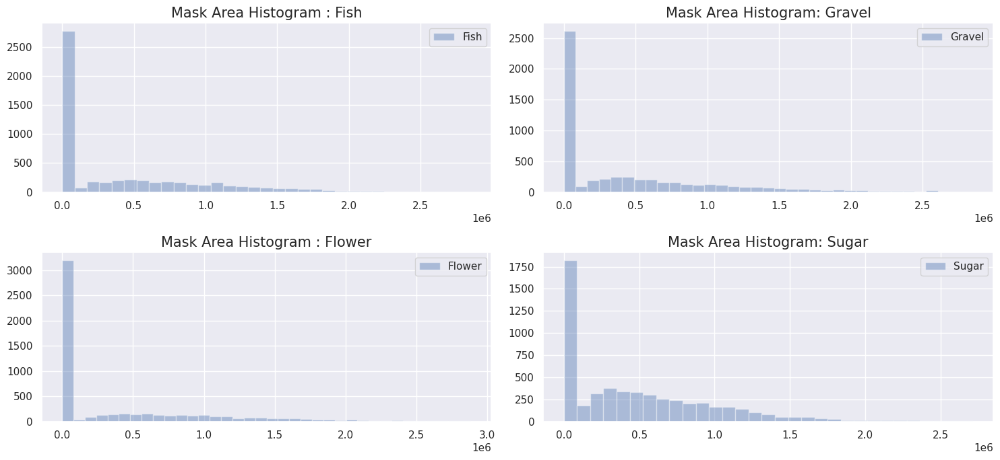

In [ ]:
# Plot Histograms and KDE plots
plt.figure(figsize=(15,7))

plt.subplot(221)
sns.distplot(masks_df[masks_df['Label'] == 'Fish']['Area'].values, kde=False, label='Fish')
plt.legend()
plt.title('Mask Area Histogram : Fish', fontsize=15)

plt.subplot(222)
sns.distplot(masks_df[masks_df['Label'] == 'Gravel']['Area'].values, kde=False, label='Gravel')
plt.legend()
plt.title('Mask Area Histogram: Gravel', fontsize=15)

plt.subplot(223)
sns.distplot(masks_df[masks_df['Label'] == 'Flower']['Area'].values, kde=False, label='Flower')
plt.legend()
plt.title('Mask Area Histogram : Flower', fontsize=15)

plt.subplot(224)
sns.distplot(masks_df[masks_df['Label'] == 'Sugar']['Area'].values, kde=False, label='Sugar')
plt.legend()
plt.title('Mask Area Histogram: Sugar', fontsize=15)

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Mask Area KDE Plot')

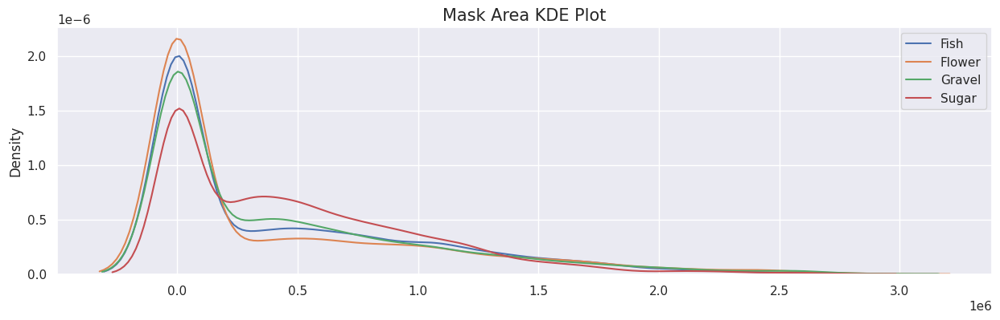

In [ ]:
plt.figure(figsize=(15,4))

plt.subplot(111)
sns.kdeplot(masks_df[masks_df['Label'] == 'Fish']['Area'].values, label='Fish')
sns.kdeplot(masks_df[masks_df['Label'] == 'Flower']['Area'].values, label='Flower')
sns.kdeplot(masks_df[masks_df['Label'] == 'Gravel']['Area'].values, label='Gravel')
sns.kdeplot(masks_df[masks_df['Label'] == 'Sugar']['Area'].values, label='Sugar')
plt.legend()

plt.title('Mask Area KDE Plot', fontsize=15)

In [ ]:
from scipy.ndimage import label, generate_binary_structure

def add_mask_number(train_df):
    '''
    Helper function to add mask area as a new column to the dataframe
    INPUT:
        train_df - dataset with training labels
    '''
    masks_df = train_df.copy()
    masks_df['NumMasks'] = 0

    s = generate_binary_structure(2,2)

    for i, row in masks_df.iterrows():
        mask = get_mask(i)

        if np.sum(mask) > 0:
            labeled_array, labels = label(mask, structure=s)
            masks_df['NumMasks'].loc[i] = labels
        else:
            masks_df['NumMasks'].loc[i] = 0

    return masks_df

In [ ]:
masks_df = add_mask_number(masks_df)

<ipython-input-47-0aff41c1dcee>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  masks_df['NumMasks'].loc[i] = labels
<ipython-input-47-0aff41c1dcee>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  masks_df['NumMasks'].loc[i] = 0


<ipython-input-49-f33b6e8d92e9>:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(masks_df[masks_df['Label'] == 'Fish']['NumMasks'].values, kde=False, label='Fish')
<ipython-input-49-f33b6e8d92e9>:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(masks_df[masks_df['Label'] == 'Gravel']['NumMasks'

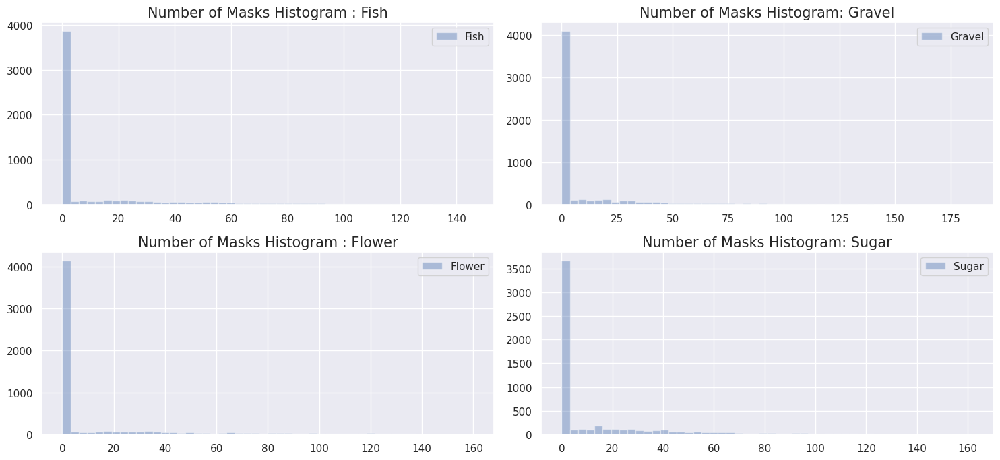

In [ ]:
# Plot Histograms and KDE plots
plt.figure(figsize=(15,7))

plt.subplot(221)
sns.distplot(masks_df[masks_df['Label'] == 'Fish']['NumMasks'].values, kde=False, label='Fish')
plt.legend()
plt.title('Number of Masks Histogram : Fish', fontsize=15)

plt.subplot(222)
sns.distplot(masks_df[masks_df['Label'] == 'Gravel']['NumMasks'].values, kde=False, label='Gravel')
plt.legend()
plt.title('Number of Masks Histogram: Gravel', fontsize=15)

plt.subplot(223)
sns.distplot(masks_df[masks_df['Label'] == 'Flower']['NumMasks'].values, kde=False, label='Flower')
plt.legend()
plt.title('Number of Masks Histogram : Flower', fontsize=15)

plt.subplot(224)
sns.distplot(masks_df[masks_df['Label'] == 'Sugar']['NumMasks'].values, kde=False, label='Sugar')
plt.legend()
plt.title('Number of Masks Histogram: Sugar', fontsize=15)

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Mask Area KDE Plot')

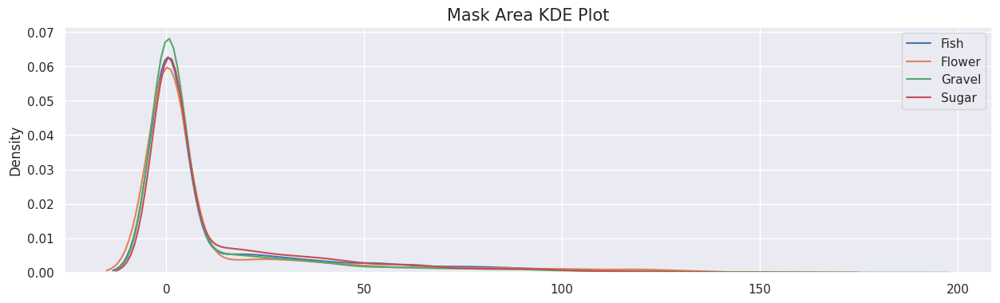

In [ ]:
plt.figure(figsize=(15,4))

plt.subplot(111)
sns.kdeplot(masks_df[masks_df['Label'] == 'Fish']['NumMasks'].values, label='Fish')
sns.kdeplot(masks_df[masks_df['Label'] == 'Flower']['NumMasks'].values, label='Flower')
sns.kdeplot(masks_df[masks_df['Label'] == 'Gravel']['NumMasks'].values, label='Gravel')
sns.kdeplot(masks_df[masks_df['Label'] == 'Sugar']['NumMasks'].values, label='Sugar')
plt.legend()

plt.title('Mask Area KDE Plot', fontsize=15)

In [ ]:
# Loading the dependencies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# Loading csv file
df = pd.read_csv("/content/drive/MyDrive/train.csv")

In [ ]:
# Exploring the data
# But this is the total number of labels that
# can be assigned to whole of the dataset
print(f"The number of data points {len(df)}")

The number of data points 22184


<Axes: >

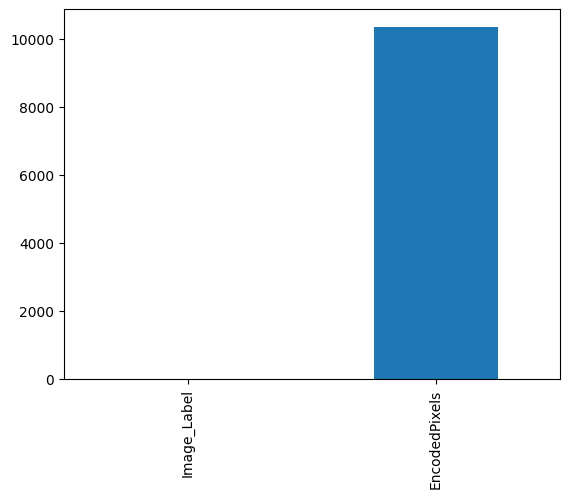

In [ ]:
# Null values in each of the columns
df.isna().sum().plot(kind="bar")

In [ ]:
# # Percentage of null values
# size = [len(df)-df.EncodedPixels.count(),df.EncodedPixels.count()]
# plt.figure(figsize=(8,8))
# plt.pie(size, labels=["empty","Non-empty"],explode=(0,0.1), autopct="%1.1f")
# plt.title("Null value percentage")

In [ ]:
# Replacing the nan values with 0s
df["EncodedPixels"] = df['EncodedPixels'].fillna(-1)

In [ ]:
# creating a new columns with label
df["Label"] = df["Image_Label"].apply(lambda x: x.split("_")[1])
# df.head()

In [ ]:
# Creating an new feature with just the image names
df["Image_name"] = df["Image_Label"].apply(lambda x: x.split("_")[0])
#df.drop("Image_Label",axis=1,inplace=True)
# df.head()

In [ ]:
# Lets check the number of each corresponding labels
def check_num(label):
  return df[(df["Label"]==label) & (df["EncodedPixels"]!=-1)]["EncodedPixels"].count()

values = {}
for i in df.Label.unique():
  values[i] = check_num(i)

print(values)
# plt.title("Number of each classes")
# pd.Series(values).plot(kind="bar")

{'Fish': 2781, 'Flower': 2365, 'Gravel': 2939, 'Sugar': 3751}


In [ ]:
def dummy_var(label):
  values = []
  df_temp = df[df["Label"]==label]
  df_temp["Dummy"] = df_temp["EncodedPixels"].apply(lambda x: 1 if x!=-1 else 0)
  return list(df_temp["Dummy"])

df_images = pd.DataFrame()
df_images["Image"] = df["Image_name"].unique()
for i in df["Label"].unique():
  df_images[i] = dummy_var(i)

# df_images.head()

<ipython-input-11-bfb702f6d312>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp["Dummy"] = df_temp["EncodedPixels"].apply(lambda x: 1 if x!=-1 else 0)
<ipython-input-11-bfb702f6d312>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp["Dummy"] = df_temp["EncodedPixels"].apply(lambda x: 1 if x!=-1 else 0)
<ipython-input-11-bfb702f6d312>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the 

In [ ]:
# Number of images available for us
print(f"Number of images: {len(df_images)}")

Number of images: 5546


In [ ]:
df_images["Total"] = df_images["Fish"]+df_images["Flower"]+df_images["Gravel"]+df_images["Sugar"]
# plt.title("Number of labels per image")
# sns.countplot(df_images["Total"])

In [ ]:
# Create one column for each mask
train_df = pd.pivot_table(df, index=['Image_name'], values=['EncodedPixels'], columns=['Label'], aggfunc=np.min).reset_index()
train_df.columns = ['image', 'Fish_mask', 'Flower_mask', 'Gravel_mask', 'Sugar_mask']

# train_df.head()

In [ ]:
# dimenesions of image
width = 2100
height = 1400

In [ ]:
# Function to decode the encoded pixels
def decode_pixels(pix, rows=2100, cols=1400,label=255):
  # coverting the string into a list of numbers
  rle_numbers = [int(num_string) for num_string in pix.split(' ')]
  # Coverting them into starting index and length pairs
  rle_pairs = np.array(rle_numbers).reshape(-1,2)
  # Creating a blank image in form of a single row array
  img = np.zeros(rows*cols, dtype=np.uint8)

  # Setting the segmented pixels in the img
  for ind, length in rle_pairs:
    ind -= 1
    img[ind:ind+length] = label
  img = img.reshape(rows,cols)
  img = img.T
  return img

In [ ]:
# Testing the function out
seg = decode_pixels(df["EncodedPixels"][4])
seg = cv2.resize(seg, (1050,700))
# plt.imshow(seg)

In [ ]:
# # Sample of the segment regions
# plt.figure(figsize=(15,8))
# j = 0
# for i in range(6):
#   plt.subplot(2,3,i+1)
#   while True:
#     if df["EncodedPixels"][j]!=-1:
#       break
#     j+=1
#   plt.imshow(decode_pixels(df["EncodedPixels"][j]))
#   plt.title(df["Image_name"][j]+"_"+df["Label"][j])
#   j+=1
#   # plt.xticks([])
#   # plt.yticks([])
# # plt.show()

In [ ]:
# location of img directory
img_dir = "/content/drive/MyDrive/train_images"

In [ ]:
# Seeing the cloumns of train.csv
df.columns

Index(['Image_Label', 'EncodedPixels', 'Label', 'Image_name'], dtype='object')

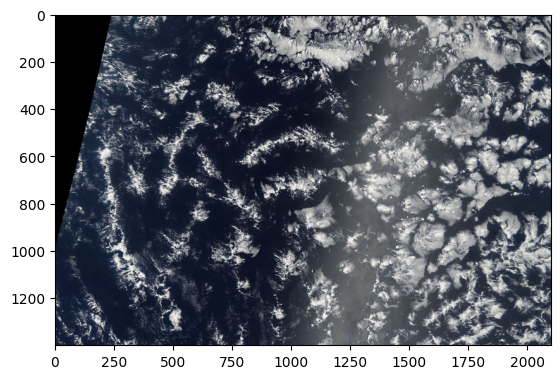

In [ ]:
# Displaying one image
path = os.path.join(img_dir,df["Image_name"][0])
img = cv2.imread(path,1)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

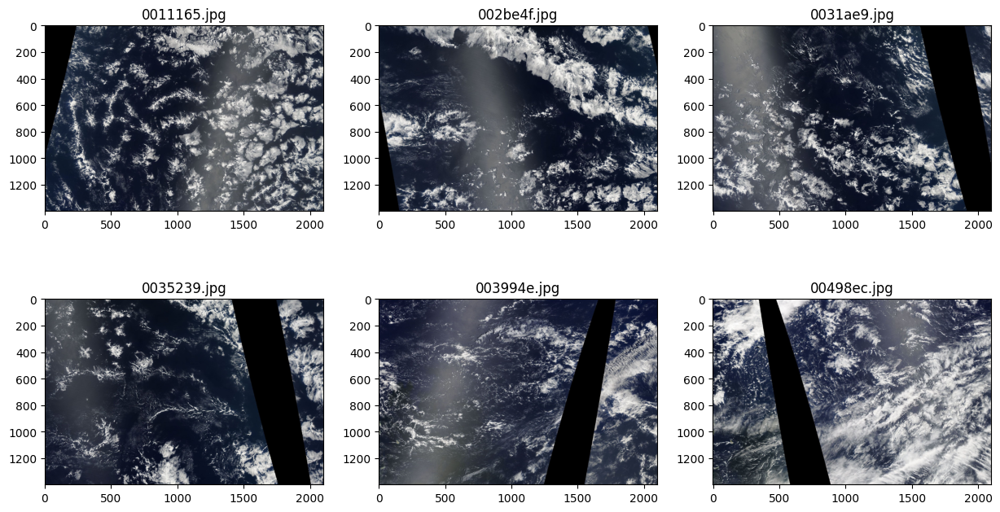

In [ ]:
# Displaying sample images
imgs = df["Image_name"].unique()[:6]
plt.figure(figsize=(15,8))
for i in range(len(imgs)):
  plt.subplot(2,3,i+1)
  path = os.path.join(img_dir,imgs[i])
  img = cv2.imread(path,1)
  plt.title(imgs[i])
  plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
# # Sample image with masks overlayed
# plt.figure(figsize=(15,8))
# j = 0
# for i in range(6):
#   plt.subplot(2,3,i+1)
#   while True:
#     if df["EncodedPixels"][j]!=-1:
#       break
#     j+=1
#   seg = decode_pixels(df["EncodedPixels"][j])
#   path = os.path.join(img_dir,df["Image_name"][j])
#   img = cv2.imread(path,0)
#   dest = cv2.addWeighted(img, 0.8, seg, 0.4, 0.0)
#   plt.imshow(dest)
#   plt.title(df["Image_name"][j])
#   j+=1
#   plt.xticks([])
#   plt.yticks([])
# plt.show()

In [ ]:
# Function to preprocess the data
BASE_DIR = "/content/drive/MyDrive/train_images"
labels = list(df["Label"].unique())
def preprocess(df):
  data = []
  for i in range(len(df)):
    if i % 100 == 0:
      print(f"{i} completed")
    path = os.path.join(BASE_DIR,df["image"][i])
    img_arr = cv2.imread(path,1)
    img_arr = cv2.resize(img_arr,(480,384))
    channels = []
    for j in df.columns[1:]:
      #print(type(df[j][i]),j,i)
      if type(df[j][i]) is not str:
            arr = np.zeros(384*480, dtype=np.uint8)
            arr = arr.reshape(480,384)
            #img = img.T
            channels.append(arr.T)
            continue
      arr = decode_pixels(df[j][i],label=1)
      arr = cv2.resize(arr,(480,384))
      channels.append(arr)

    data.append([img_arr/255,np.dstack(channels)])
  return data

In [ ]:
# Sanity check on the output
data = preprocess(train_df[:5])
len(data)

0 completed


5

In [ ]:
# Checking the shape of image
data[1][0].shape

(384, 480, 3)

In [ ]:
# Checking the shape of segmentation mask
data[1][1].shape

(384, 480, 4)

In [ ]:
img_dir = "/content/drive/MyDrive/train_images"
masks_dir = "./masks"

In [ ]:
# utility function for Data Generators
BASE_DIR = "/content/drive/MyDrive/train_images"
labels = list(df["Label"].unique())

def preprocess1(df):
    # To store the data
    data = []
    # Iterating through each of the rows in the dataframe
    for i in range(len(df)):
        # Getting the path of the image
        path = os.path.join(BASE_DIR,df.iloc[i]["image"])
        # Reading in the image
        img_arr = cv2.imread(path,1)
        # Resizing it to the proper size
        img_arr = cv2.resize(img_arr,(480,384))
        # To store the differnt segmentation maps
        channels = []
        # Getting the differnt segmentation maps
        for j in df.columns[1:]:
          # making an empty map if the image doesn't contain a label
          if type(df.iloc[i][j]) is not str:
                arr = np.zeros(384*480, dtype=np.uint8)
                arr = arr.reshape(480,384)
                channels.append(arr.T)
                continue
          # Creating the segmentation map
          arr = decode_pixels(df.iloc[i][j],label=1)
          # Resizing it to proper size
          arr = cv2.resize(arr,(480,384))
          channels.append(arr)
        # Adding to the data list as [image, output seg map]
        data.append([img_arr/255,np.dstack(channels)])
    # Spliting the data into input and output
    imgs = []
    masks = []
    for i, j in data:
        imgs.append(i)
        masks.append(j)

    return np.array(imgs), np.array(masks).astype(np.float)

In [ ]:
# Creating a custom Data Generator
def data_gen(img_folder, df, batch_size):

    c = 0
    n = list(df["image"])
    while True:
        c1 = c+batch_size

        if c1 > len(df):
            c1 = len(df)
        imgs, masks = preprocess1(df.iloc[c:c1])
        c = c1
        if c1 >= len(df):
            c = 0
        if imgs.shape == (batch_size,384, 480, 3) and masks.shape == (batch_size,384, 480, 4):
            yield imgs, masks
        else:
            continue


In [ ]:
# Sample check to see if the code is working
this = data_gen(img_folder=img_dir, df=train_df, batch_size=8)

In [ ]:
# Checking
k = 0
for i,j in this:
    if k == 5:
        break
    # print(i.shape,j.shape)
    k+=1

<ipython-input-34-416dc83a95fb>:40: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return np.array(imgs), np.array(masks).astype(np.float)


In [ ]:
# Installing the segmentation_models library
! pip install segmentation_models

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 5.4 MB/s eta 0:00:00


In [ ]:
!pip install --upgrade tensorflow
!pip install --upgrade keras


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.1/524.1 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 61.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 60.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.8/440.8 kB 37.2 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.7.1
    Uninstalling typing_extensions-4.7.1:
      Successfully uninstalled typing_extensions-4.7.1
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.12.0
    Uninstalling tensorflow-estimator-2.12.0:
      Successfully uninstalled tensorflow-estimator-2.12.0
  Attempting uninstall: keras
    Found existing installation: keras 2.12.0
    Uninstalling keras-2.12.0:
      Successfully uninstalled keras-2.12.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.12.3
    Uninstalling tensorboard-2.12.

In [ ]:
!pip install -U tensorflow
!pip install upgrad keras-segmentation

# import tensorflow as tf
# from keras_segmentation import models as sm
# from keras_segmentation import metrics

# tf.keras.backend.clear_session()


ERROR: Could not find a version that satisfies the requirement upgrad (from versions: none)
ERROR: No matching distribution found for upgrad


In [ ]:
!pip install -U -q segmentation-models
!pip install -q tensorflow==2.2.1
!pip install -q keras==2.5
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm
import tensorflow as tf
from tensorflow import keras
tf.compat.v1.enable_eager_execution()
import segmentation_models as sm
import glob
import cv2
import os
import numpy as np
from matplotlib import pyplot as plt
#import keras
from tensorflow.keras.utils import normalize
from tensorflow.keras.metrics import MeanIoU

ERROR: Could not find a version that satisfies the requirement tensorflow==2.2.1 (from versions: 2.8.0rc0, 2.8.0rc1, 2.8.0, 2.8.1, 2.8.2, 2.8.3, 2.8.4, 2.9.0rc0, 2.9.0rc1, 2.9.0rc2, 2.9.0, 2.9.1, 2.9.2, 2.9.3, 2.10.0rc0, 2.10.0rc1, 2.10.0rc2, 2.10.0rc3, 2.10.0, 2.10.1, 2.11.0rc0, 2.11.0rc1, 2.11.0rc2, 2.11.0, 2.11.1, 2.12.0rc0, 2.12.0rc1, 2.12.0, 2.12.1, 2.13.0rc0, 2.13.0rc1, 2.13.0rc2, 2.13.0)
ERROR: No matching distribution found for tensorflow==2.2.1
ERROR: Could not find a version that satisfies the requirement keras==2.5 (from versions: 0.2.0, 0.3.0, 0.3.1, 0.3.2, 0.3.3, 1.0.0, 1.0.1, 1.0.2, 1.0.3, 1.0.4, 1.0.5, 1.0.6, 1.0.7, 1.0.8, 1.1.0, 1.1.1, 1.1.2, 1.2.0, 1.2.1, 1.2.2, 2.0.0, 2.0.1, 2.0.2, 2.0.3, 2.0.4, 2.0.5, 2.0.6, 2.0.7, 2.0.8, 2.0.9, 2.1.0, 2.1.1, 2.1.2, 2.1.3, 2.1.4, 2.1.5, 2.1.6, 2.2.0, 2.2.1, 2.2.2, 2.2.3, 2.2.4, 2.2.5, 2.3.0, 2.3.1, 2.4.0, 2.4.1, 2.4.2, 2.4.3, 2.5.0rc0, 2.6.0rc0, 2.6.0rc1, 2.6.0rc2, 2.6.0rc3, 2.6.0, 2.7.0rc0, 2.7.0rc2, 2.7.0, 2.8.0rc0, 2.8.0rc1, 2.8.0

In [ ]:
BACKBONE = 'densenet169'
LEARNING_RATE = 0.002
HEIGHT = 384
WIDTH = 480
CHANNELS = 3
N_CLASSES = 4
ES_PATIENCE = 10
RLROP_PATIENCE = 3
DECAY = 0.0001
DECAY_DROP = 0.2
model_path = f'uNet_%s_%sx%s_lr{LEARNING_RATE}.h5' % (BACKBONE, HEIGHT, WIDTH)





In [ ]:
# Setting up the optimizer
optim = tf.keras.optimizers.Adam(LEARNING_RATE)

# Setting up the metrics
metrics = [sm.metrics.IOUScore(threshold=0.50),sm.metrics.FScore(threshold=0.5)]

# Setting up the Callbacks
checkpoint = tf.keras.callbacks.ModelCheckpoint(model_path, monitor='val_loss', mode='min', save_best_only=True, save_weights_only=True)
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
rlrop = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)

# Final list of call backs
callback_list = [checkpoint, es, rlrop]







In [ ]:
# Defining model
model = sm.Unet(backbone_name=BACKBONE,
                encoder_weights='imagenet',
                classes=N_CLASSES,
                activation='sigmoid', encoder_freeze=True,
                input_shape=(HEIGHT, WIDTH, CHANNELS))

# Compiling the model
model.compile(optimizer=optim, loss=sm.losses.bce_dice_loss, metrics=metrics)

# Model summary
model.summary()

51877672/51877672 [==============================] - 4s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 384, 480, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 390, 486, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 192, 240, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  

In [ ]:
# Total number of images
print(f"Total size of data {len(train_df)}")

Total size of data 5546


In [ ]:
# Training and Testing Data
train = train_df.iloc[0:4500]
test = train_df.iloc[4500:5000]
batch_size = 8

In [ ]:
# Data Generators
Train_data_generator = data_gen(img_folder=img_dir, df=train, batch_size=batch_size)
Validation_data_generator = data_gen(img_folder=img_dir, df=test, batch_size=batch_size)

In [ ]:
history = model.fit(Train_data_generator,epochs=5,
                             steps_per_epoch=(4500//batch_size),
                             validation_data=Validation_data_generator,
                             validation_steps=(500//batch_size),
                             callbacks=callback_list)

Epoch 1/5


<ipython-input-34-416dc83a95fb>:40: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return np.array(imgs), np.array(masks).astype(np.float)


562/562 [==============================] - 6631s 12s/step - loss: 0.9187 - iou_score: 0.3445 - f1-score: 0.4925 - val_loss: 1.2414 - val_iou_score: 0.2676 - val_f1-score: 0.4010 - lr: 0.0020
Epoch 2/5
562/562 [==============================] - 453s 807ms/step - loss: 0.8364 - iou_score: 0.3985 - f1-score: 0.5550 - val_loss: 0.8946 - val_iou_score: 0.3711 - val_f1-score: 0.5213 - lr: 0.0020
Epoch 3/5
562/562 [==============================] - 495s 881ms/step - loss: 0.8054 - iou_score: 0.4175 - f1-score: 0.5743 - val_loss: 0.8522 - val_iou_score: 0.3904 - val_f1-score: 0.5389 - lr: 0.0020
Epoch 4/5
562/562 [==============================] - 493s 879ms/step - loss: 0.7819 - iou_score: 0.4326 - f1-score: 0.5896 - val_loss: 0.8937 - val_iou_score: 0.3630 - val_f1-score: 0.5081 - lr: 0.0020
Epoch 5/5
562/562 [==============================] - 491s 873ms/step - loss: 0.7618 - iou_score: 0.4465 - f1-score: 0.6033 - val_loss: 0.8603 - val_iou_score: 0.3739 - val_f1-score: 0.5165 - lr: 0.0020


In [ ]:
res = model.evaluate(Validation_data_generator,steps=500//16)
print(f"Loss:{res[0]}")
print(f"IoU:{res[1]}")
print(f"F1:{res[2]}")

<ipython-input-34-416dc83a95fb>:40: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return np.array(imgs), np.array(masks).astype(np.float)


31/31 [==============================] - 19s 613ms/step - loss: 0.8625 - iou_score: 0.3675 - f1-score: 0.5084
Loss:0.862456738948822
IoU:0.36750343441963196
F1:0.5084342360496521


In [ ]:
model.save(f"clouds_densenet169_iouscore-{str(res[1])[:5]}.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


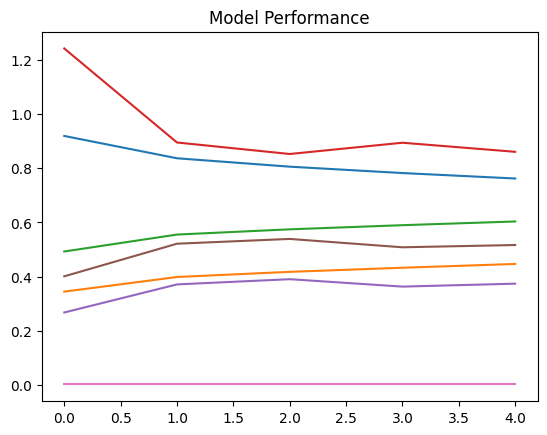

In [ ]:
# All the curves together
df_res = pd.DataFrame(history.history)
plt.title("Model Performance")
plt.plot(df_res)
plt.show()

In [ ]:
# Looking at the columns of the result df
df_res.columns

Index(['loss', 'iou_score', 'f1-score', 'val_loss', 'val_iou_score',
       'val_f1-score', 'lr'],
      dtype='object')

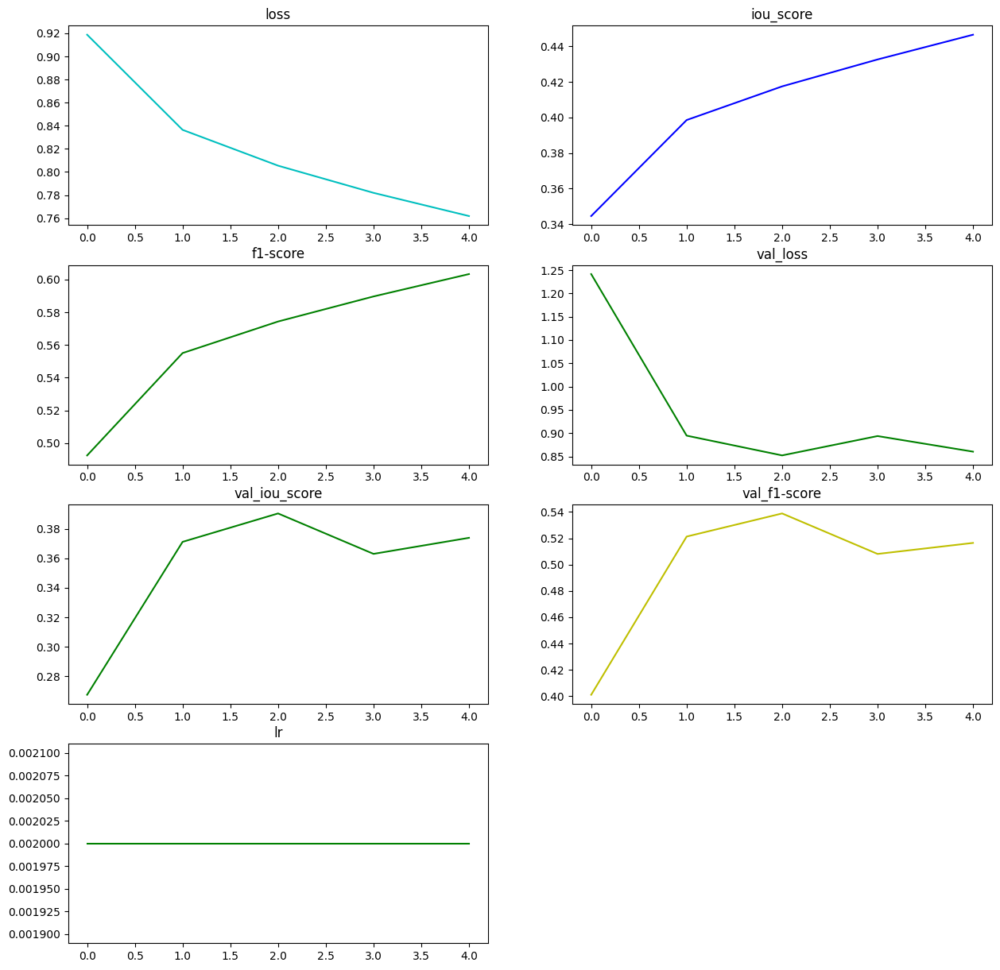

In [ ]:
# Each of the learning curves for the model has been displayed separately
colors = "bgrcy"
plt.figure(figsize=(15,15))
for i in range(len(df_res.columns)):
    plt.subplot(4,2,i+1)
    df_res[df_res.columns[i]].plot(color=colors[random.randint(0,4)])
    plt.title(df_res.columns[i])
plt.show()

In [ ]:
# Thresholding function to be applied on the output
def threshold(x):
    if x>0.5:
        return 1
    else:
        return 0

# Making the function applicable to a numpy array
exp =np.vectorize(threshold)

In [ ]:
# Function to compare the predicted mask to the actual mask
# Function simply plots the actual and predicted mask of the 4 classes
# side by side
def compare_masks(actual,predicted):
    plt.figure(figsize=(15,15))
    j = 0
    for i in range(8):
        plt.subplot(4,2,i+1)
        if (i+1)%2!=0:
            plt.title(f"Actual-{labels[j]}")
            plt.imshow(actual[:,:,j])
        else:
            plt.title(f"Predicted-{labels[j]}")
            plt.imshow(predicted[:,:,j])
            j+=1
    plt.show()

In [ ]:
# Function to predict and visualise the outputs of the models
# Simply combine the above 2 functions together
def predict(df):
    data = preprocess(df)
    output = model.predict(data[0][0][ np.newaxis, ...])
    output = exp(output)
    compare_masks(data[0][1],output[0])
    return

In [ ]:
# Function to display the actual image
def display_img(img_name):
    path = os.path.join(img_dir,img_name)
    img = cv2.imread(path,1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)

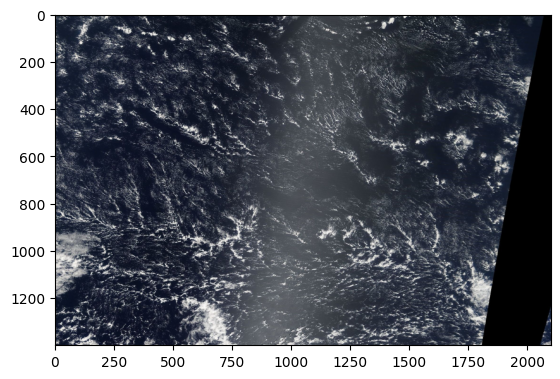

In [ ]:
# Displaying the actual image
display_img(train_df["image"][5107])

0 completed
1/1 [==============================] - 6s 6s/step


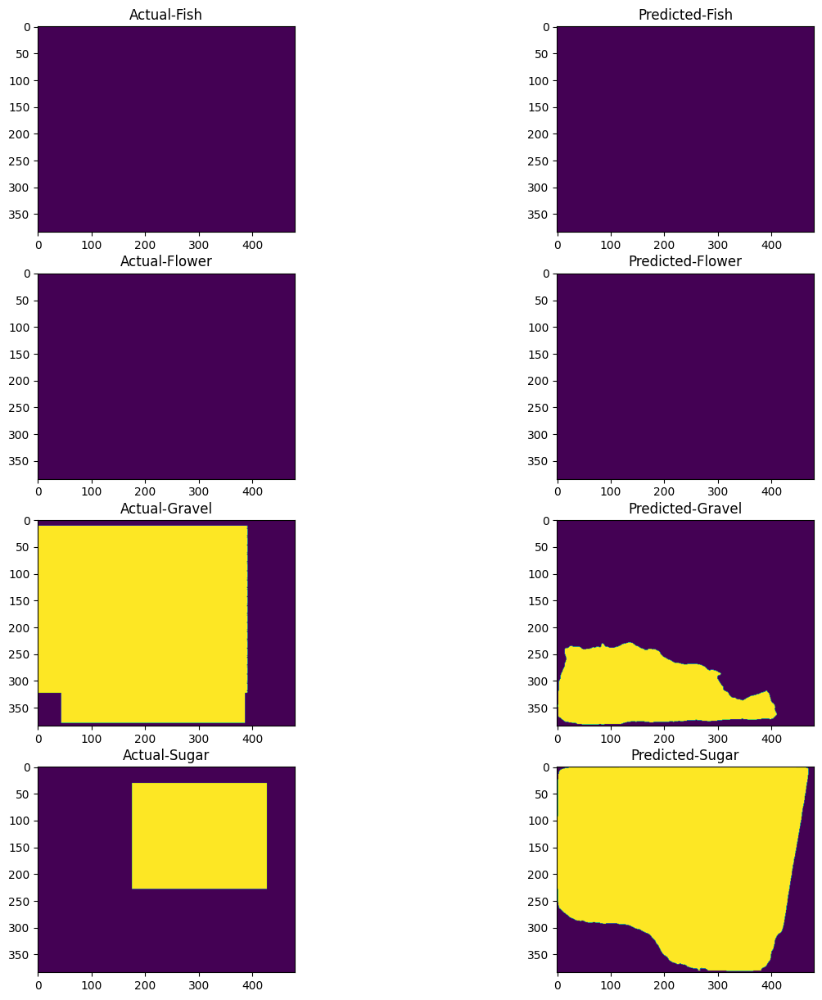

In [ ]:
# Performance of model on image
test = pd.DataFrame(train_df.iloc[5107]).T.reset_index().drop("index",axis=1)
predict(test)

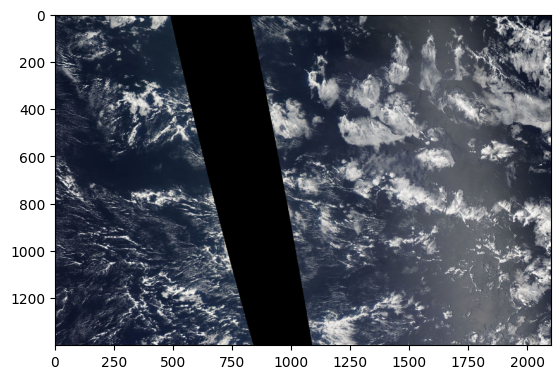

In [ ]:
# Displaying the actual image
display_img(train_df["image"][5101])

0 completed
1/1 [==============================] - 0s 80ms/step


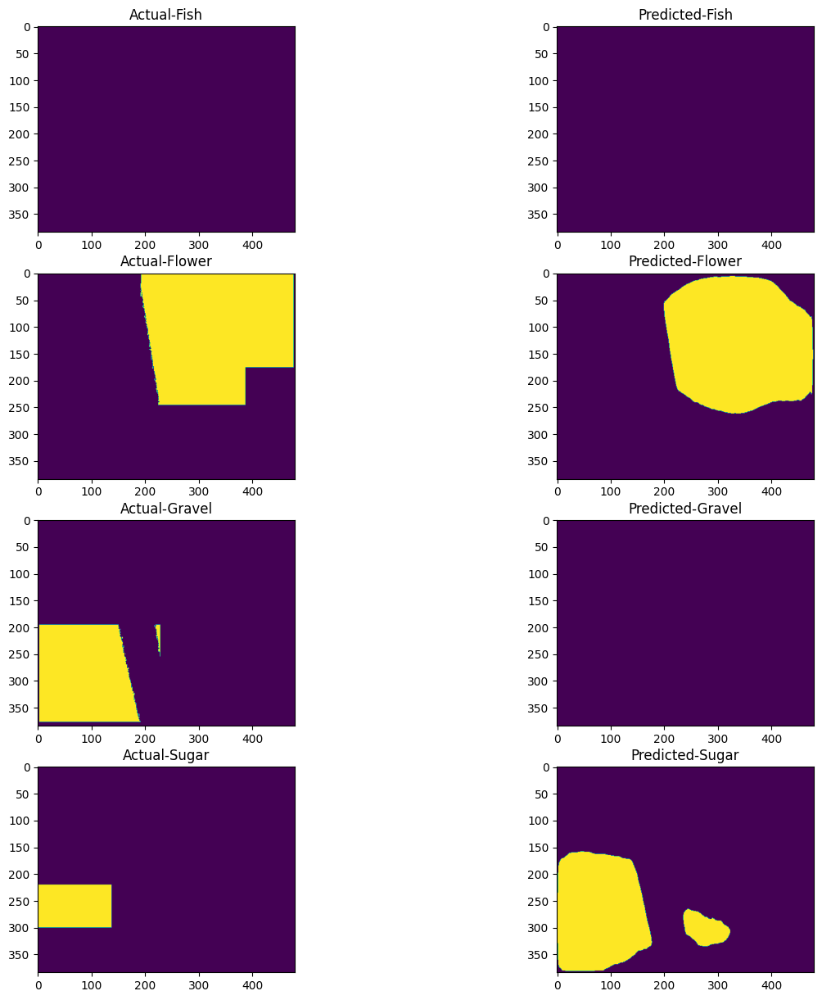

In [ ]:
test = pd.DataFrame(train_df.iloc[5101]).T.reset_index().drop("index",axis=1)
predict(test)

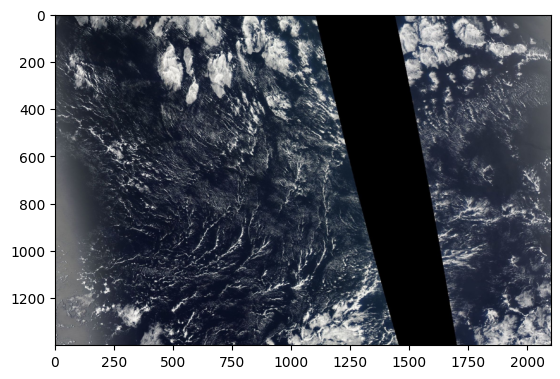

In [ ]:
# Displaying the actual image
display_img(train_df["image"][5105])

0 completed
1/1 [==============================] - 0s 37ms/step


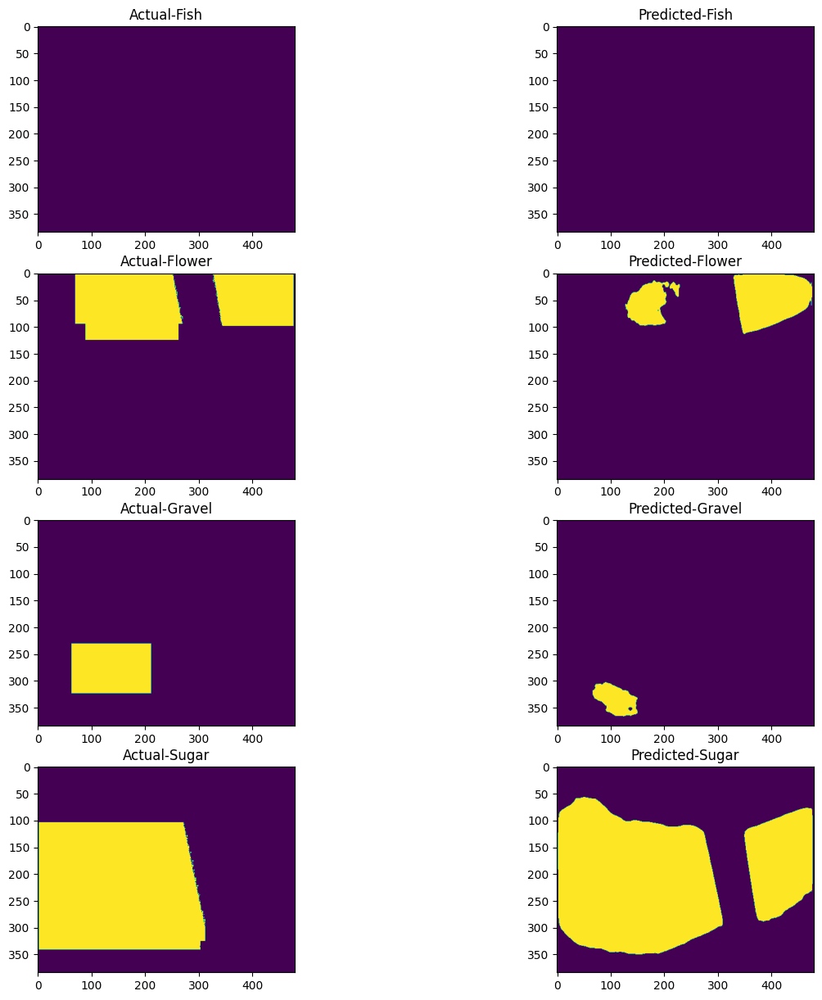

In [ ]:
test = pd.DataFrame(train_df.iloc[5105]).T.reset_index().drop("index",axis=1)
predict(test)

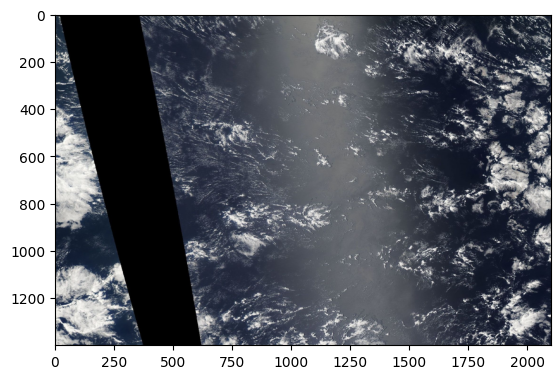

In [ ]:
# Displaying the actual image
display_img(train_df["image"][5108])

0 completed
1/1 [==============================] - 0s 34ms/step


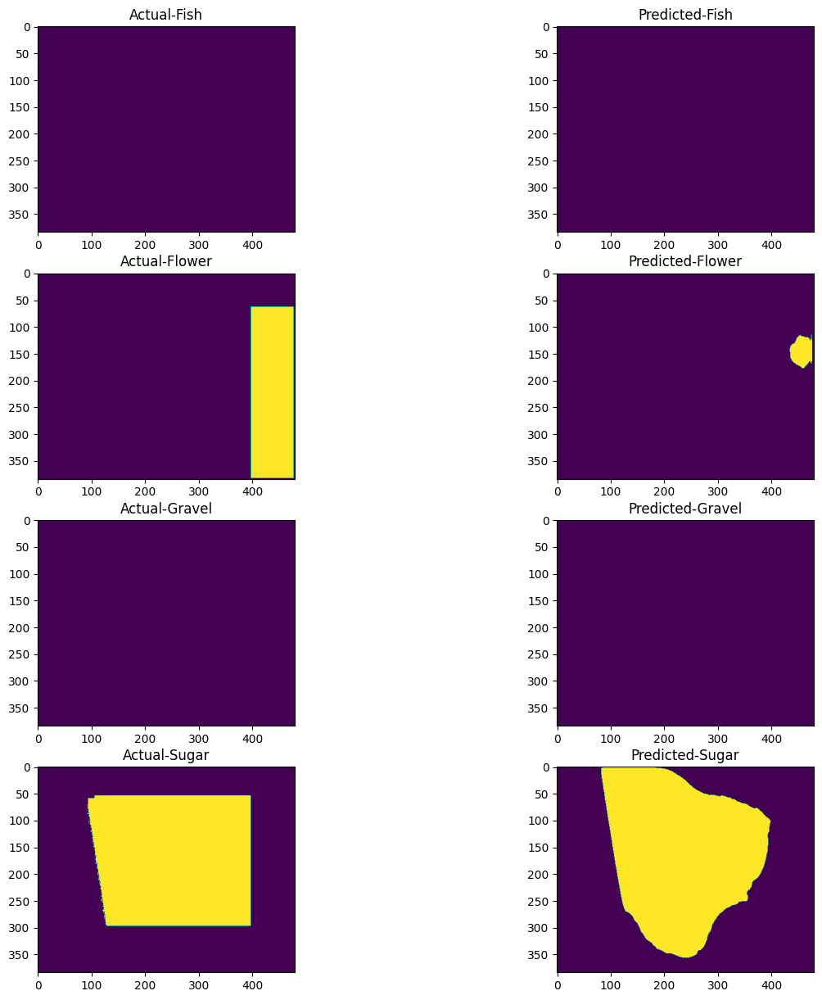

In [ ]:
test = pd.DataFrame(train_df.iloc[5108]).T.reset_index().drop("index",axis=1)
predict(test)

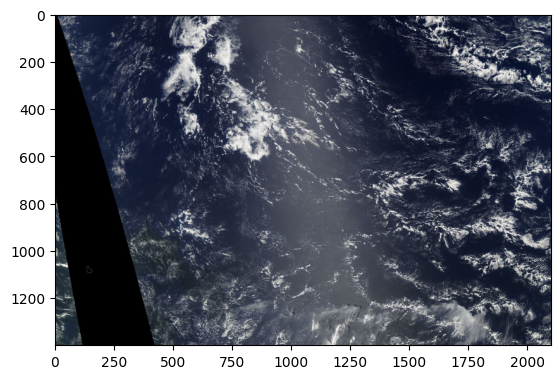

In [ ]:
# Displaying the actual image
display_img(train_df["image"][5117])

0 completed
1/1 [==============================] - 0s 33ms/step


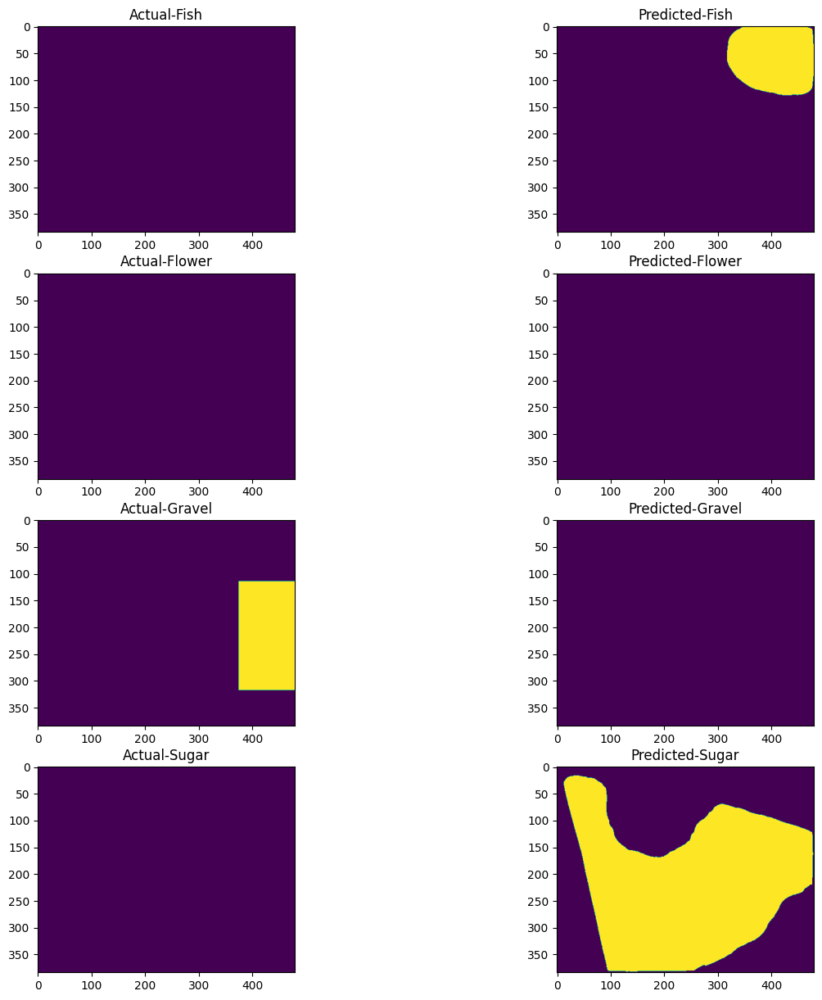

In [ ]:
test = pd.DataFrame(train_df.iloc[5117]).T.reset_index().drop("index",axis=1)
predict(test)

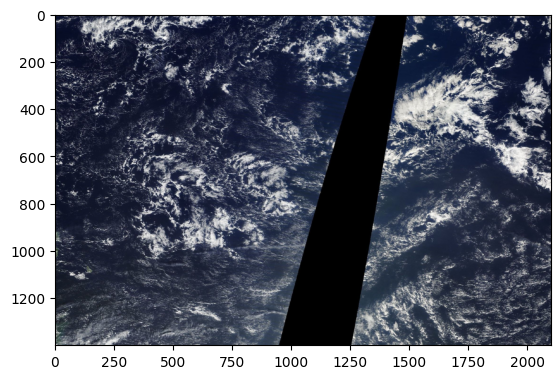

In [ ]:
# Displaying the actual image
display_img(train_df["image"][510])

0 completed
1/1 [==============================] - 0s 52ms/step


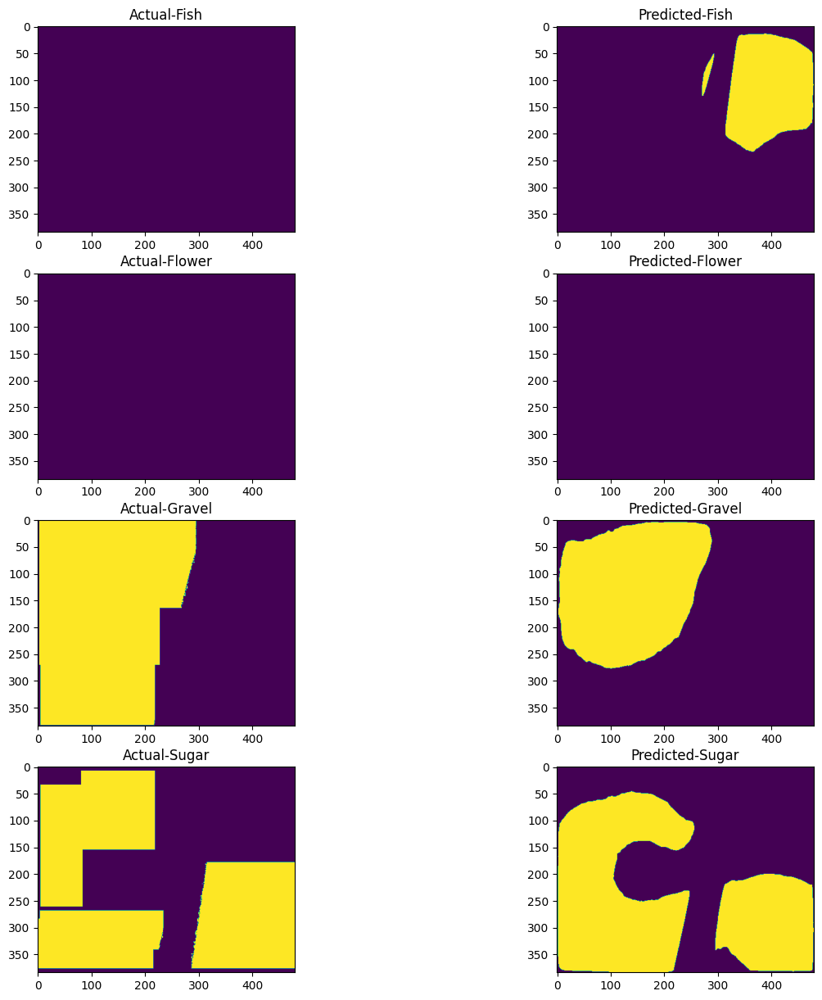

In [ ]:
test = pd.DataFrame(train_df.iloc[510]).T.reset_index().drop("index",axis=1)
predict(test)